**Swin UNETR, FedAdam**

**Imports & Drive Mount**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import SwinUNETR
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints"
log_dir = "D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs"

Checkpoints will be saved to: D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints
TensorBoard logs will be saved to: D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs


Reusing TensorBoard on port 6007 (pid 17176), started 7 days, 5:41:07 ago. (Use '!kill 17176' to kill it.)

In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [7]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [8]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [9]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


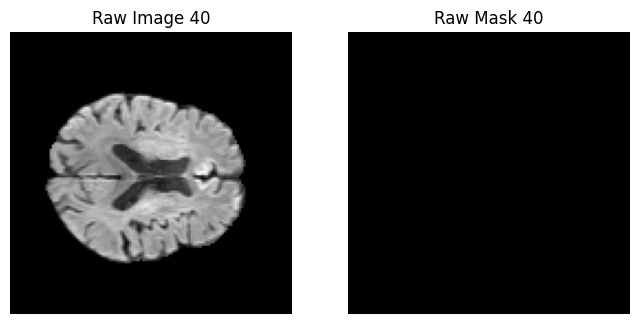

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


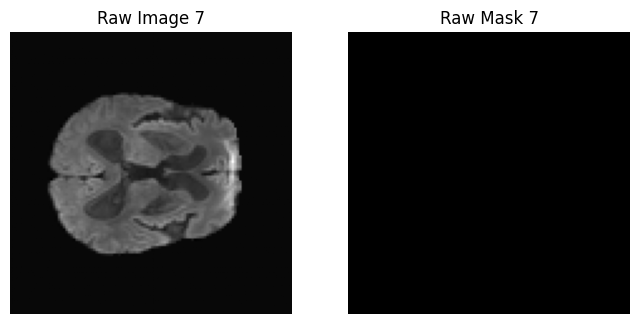

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


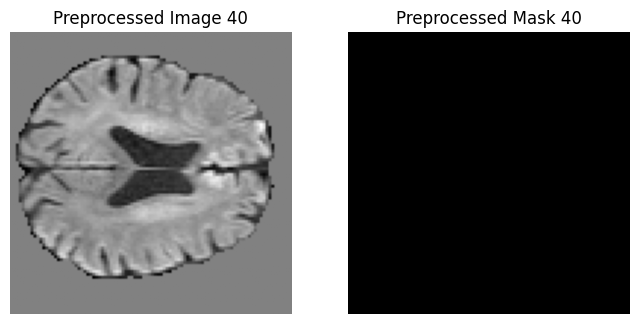

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


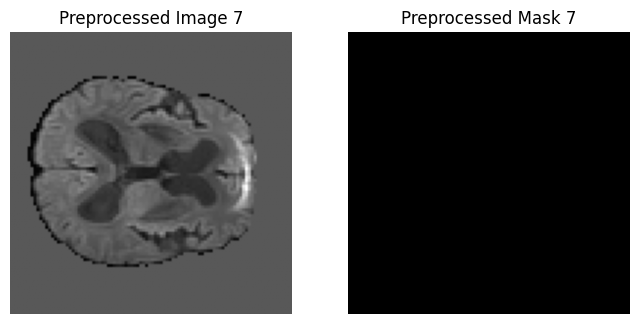

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


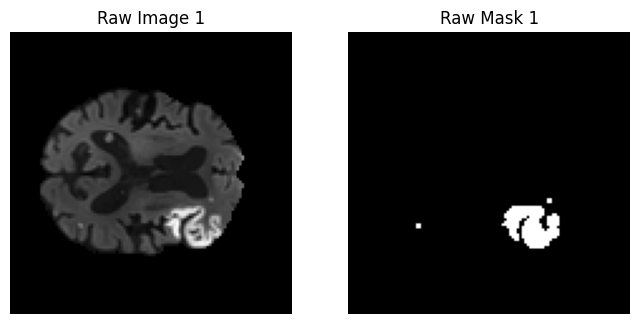

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


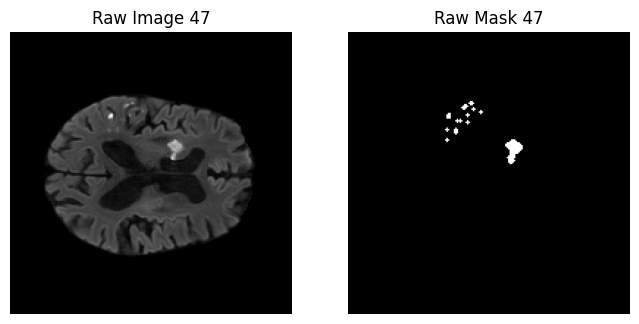

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


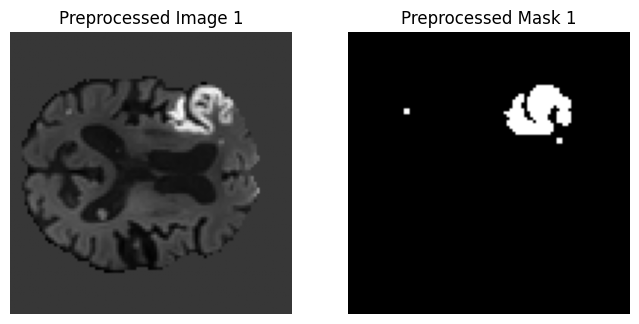

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


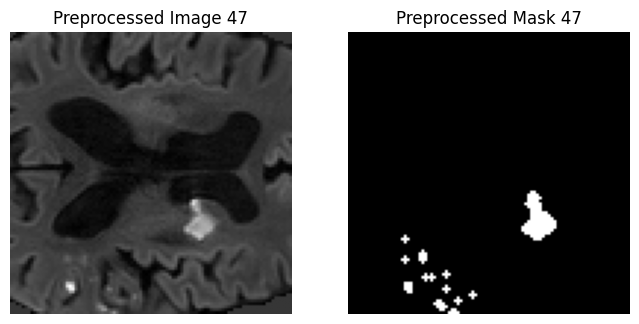

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


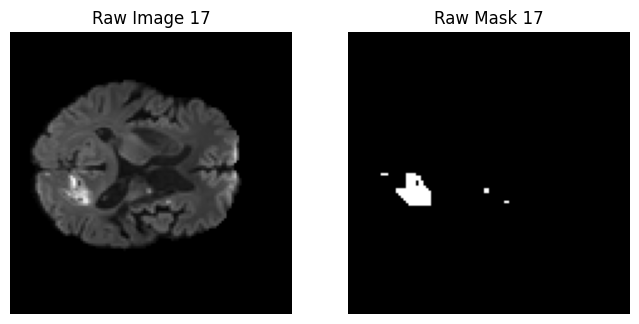

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


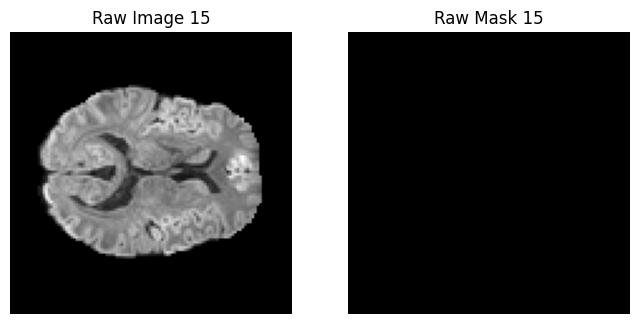

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


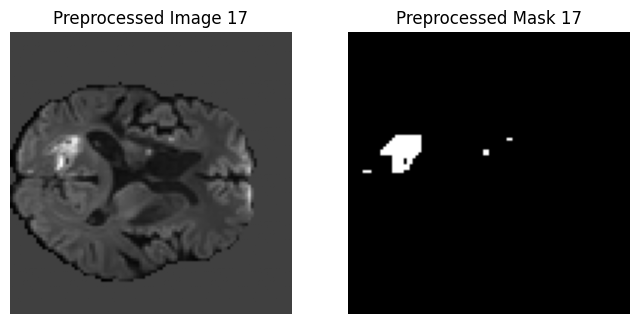

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


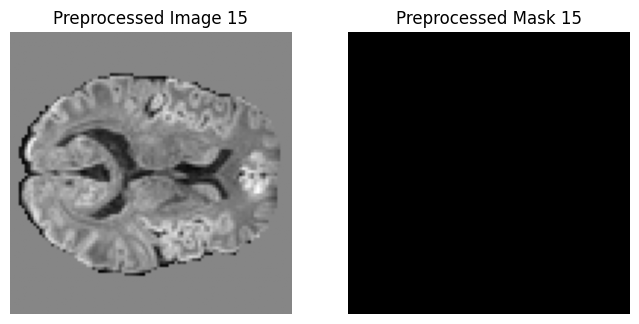

Client 2 samples: 50


In [10]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [11]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


Swin UNETR

In [12]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [13]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

def create_model():
    model = SwinUNETR(
        in_channels=1,
        out_channels=1,
        feature_size=24,
        use_checkpoint=True
    ).to(device)

    print(model)
    return model

Using device: cuda


**Client Class**

In [14]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [15]:
class Server:
    def __init__(self, val_loader, device, lr=1e-3, beta1=0.9, beta2=0.999, eps=1e-8):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader
        
        # FedAdam
        self.lr = lr
        self.beta1 = beta1
        self.beta2 = beta2
        self.eps = eps

        # Adam states
        self.m = {}
        self.v = {}

        for k, v in self.global_model.state_dict().items():
            if v.dtype != torch.long:
                self.m[k] = torch.zeros_like(v)
                self.v[k] = torch.zeros_like(v)

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):

        global_params = self.global_model.state_dict()

        # ---- Step 1: compute FedAvg weights (same as before) ----
        avg_params = {}

        for key in client_params_list[0].keys():
            # If parameter is integer type → just copy from first client
            if client_params_list[0][key].dtype == torch.long:
                avg_params[key] = client_params_list[0][key]
                continue
            
            # Average float parameters
            avg_params[key] = client_params_list[0][key].clone()

            for i in range(1, len(client_params_list)):
                avg_params[key] += client_params_list[i][key]

            avg_params[key] /= len(client_params_list)

        # ---- Step 2: FedAdam update ----
        new_params = {}

        for key in global_params.keys():

            if global_params[key].dtype == torch.long:
                new_params[key] = global_params[key]
                continue

            avg_param = avg_params[key].to(self.device)
            
            delta = avg_param - global_params[key]

            # Adam moments
            self.m[key] = self.beta1 * self.m[key] + (1 - self.beta1) * delta
            self.v[key] = self.beta2 * self.v[key] + (1 - self.beta2) * (delta ** 2)

            update = self.lr * self.m[key] / (torch.sqrt(self.v[key]) + self.eps)

            new_params[key] = global_params[key] + update

        self.global_model.load_state_dict(new_params)
   

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [16]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

SwinUNETR(
  (swinViT): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 24, kernel_size=(2, 2, 2), stride=(2, 2, 2))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers1): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0-1): 2 x SwinTransformerBlock(
            (norm1): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=24, out_features=72, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=24, out_features=24, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (mlp): MLPBlock(
              (linear1): Linear(in_features=24, out_features=96, bias=True)
              (linear2): Linear(in_features=

**Federated Training loop**

In [17]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8640 | Dice: 0.0422 | IoU: 0.0216 | HD95: 47.7086


Client 0 | Epoch 2/20 | Loss: 0.8284 | Dice: 0.1078 | IoU: 0.0570 | HD95: 46.0007


Client 0 | Epoch 3/20 | Loss: 0.8132 | Dice: 0.1377 | IoU: 0.0739 | HD95: 47.0426


Client 0 | Epoch 4/20 | Loss: 0.8009 | Dice: 0.1671 | IoU: 0.0912 | HD95: 46.4444


Client 0 | Epoch 5/20 | Loss: 0.7880 | Dice: 0.2176 | IoU: 0.1221 | HD95: 43.4838


Client 0 | Epoch 6/20 | Loss: 0.7772 | Dice: 0.2481 | IoU: 0.1416 | HD95: 40.3558


Client 0 | Epoch 7/20 | Loss: 0.7682 | Dice: 0.2818 | IoU: 0.1640 | HD95: 37.3436


Client 0 | Epoch 8/20 | Loss: 0.7621 | Dice: 0.2763 | IoU: 0.1603 | HD95: 35.6261


Client 0 | Epoch 9/20 | Loss: 0.7541 | Dice: 0.3392 | IoU: 0.2042 | HD95: 35.5101


Client 0 | Epoch 10/20 | Loss: 0.7475 | Dice: 0.3541 | IoU: 0.2151 | HD95: 33.8651


Client 0 | Epoch 11/20 | Loss: 0.7418 | Dice: 0.3772 | IoU: 0.2325 | HD95: 32.2048


Client 0 | Epoch 12/20 | Loss: 0.7362 | Dice: 0.4057 | IoU: 0.2545 | HD95: 30.6597


Client 0 | Epoch 13/20 | Loss: 0.7310 | Dice: 0.4018 | IoU: 0.2514 | HD95: 29.1941


Client 0 | Epoch 14/20 | Loss: 0.7261 | Dice: 0.4176 | IoU: 0.2639 | HD95: 29.6352


Client 0 | Epoch 15/20 | Loss: 0.7216 | Dice: 0.4371 | IoU: 0.2797 | HD95: 29.6107


Client 0 | Epoch 16/20 | Loss: 0.7165 | Dice: 0.4518 | IoU: 0.2918 | HD95: 28.4947


Client 0 | Epoch 17/20 | Loss: 0.7121 | Dice: 0.4261 | IoU: 0.2707 | HD95: 26.1303


Client 0 | Epoch 18/20 | Loss: 0.7067 | Dice: 0.4627 | IoU: 0.3010 | HD95: 26.3863


Client 0 | Epoch 19/20 | Loss: 0.7021 | Dice: 0.4818 | IoU: 0.3173 | HD95: 24.9552


Clients Training:  33%|███▎      | 1/3 [06:55<13:51, 415.60s/it]

Client 0 | Epoch 20/20 | Loss: 0.6980 | Dice: 0.4842 | IoU: 0.3194 | HD95: 24.4377
Client 0 | Loss=0.7548 | Dice=0.4842 | IoU=0.3194 | HD95=24.4377


Client 1 | Epoch 1/20 | Loss: 0.8634 | Dice: 0.0418 | IoU: 0.0213 | HD95: 42.5643


Client 1 | Epoch 2/20 | Loss: 0.8263 | Dice: 0.1051 | IoU: 0.0555 | HD95: 42.3722


Client 1 | Epoch 3/20 | Loss: 0.8110 | Dice: 0.1386 | IoU: 0.0745 | HD95: 43.6751


Client 1 | Epoch 4/20 | Loss: 0.7975 | Dice: 0.1809 | IoU: 0.0995 | HD95: 43.1362


Client 1 | Epoch 5/20 | Loss: 0.7848 | Dice: 0.2301 | IoU: 0.1300 | HD95: 41.2060


Client 1 | Epoch 6/20 | Loss: 0.7751 | Dice: 0.3100 | IoU: 0.1835 | HD95: 37.6526


Client 1 | Epoch 7/20 | Loss: 0.7670 | Dice: 0.3253 | IoU: 0.1942 | HD95: 33.9631


Client 1 | Epoch 8/20 | Loss: 0.7601 | Dice: 0.3539 | IoU: 0.2150 | HD95: 32.2542


Client 1 | Epoch 9/20 | Loss: 0.7532 | Dice: 0.3890 | IoU: 0.2415 | HD95: 30.6101


Client 1 | Epoch 10/20 | Loss: 0.7470 | Dice: 0.4027 | IoU: 0.2522 | HD95: 29.3718


Client 1 | Epoch 11/20 | Loss: 0.7417 | Dice: 0.4339 | IoU: 0.2771 | HD95: 29.0254


Client 1 | Epoch 12/20 | Loss: 0.7374 | Dice: 0.4170 | IoU: 0.2634 | HD95: 30.5092


Client 1 | Epoch 13/20 | Loss: 0.7309 | Dice: 0.4456 | IoU: 0.2866 | HD95: 27.2373


Client 1 | Epoch 14/20 | Loss: 0.7252 | Dice: 0.4562 | IoU: 0.2955 | HD95: 26.5765


Client 1 | Epoch 15/20 | Loss: 0.7196 | Dice: 0.4854 | IoU: 0.3205 | HD95: 24.7217


Client 1 | Epoch 16/20 | Loss: 0.7144 | Dice: 0.4908 | IoU: 0.3252 | HD95: 24.2810


Client 1 | Epoch 17/20 | Loss: 0.7096 | Dice: 0.5011 | IoU: 0.3344 | HD95: 22.6566


Client 1 | Epoch 18/20 | Loss: 0.7053 | Dice: 0.4954 | IoU: 0.3292 | HD95: 24.0715


Client 1 | Epoch 19/20 | Loss: 0.7010 | Dice: 0.5236 | IoU: 0.3547 | HD95: 22.9861


Clients Training:  67%|██████▋   | 2/3 [13:48<06:53, 413.89s/it]

Client 1 | Epoch 20/20 | Loss: 0.6970 | Dice: 0.4956 | IoU: 0.3294 | HD95: 22.9284
Client 1 | Loss=0.7534 | Dice=0.4956 | IoU=0.3294 | HD95=22.9284


Client 2 | Epoch 1/20 | Loss: 0.8620 | Dice: 0.0578 | IoU: 0.0298 | HD95: 45.9184


Client 2 | Epoch 2/20 | Loss: 0.8245 | Dice: 0.1417 | IoU: 0.0763 | HD95: 45.1582


Client 2 | Epoch 3/20 | Loss: 0.8077 | Dice: 0.1714 | IoU: 0.0938 | HD95: 46.4183


Client 2 | Epoch 4/20 | Loss: 0.7932 | Dice: 0.2198 | IoU: 0.1235 | HD95: 46.2495


Client 2 | Epoch 5/20 | Loss: 0.7803 | Dice: 0.2875 | IoU: 0.1678 | HD95: 42.8855


Client 2 | Epoch 6/20 | Loss: 0.7703 | Dice: 0.3446 | IoU: 0.2082 | HD95: 39.6469


Client 2 | Epoch 7/20 | Loss: 0.7620 | Dice: 0.3853 | IoU: 0.2386 | HD95: 36.6231


Client 2 | Epoch 8/20 | Loss: 0.7546 | Dice: 0.4104 | IoU: 0.2582 | HD95: 34.0149


Client 2 | Epoch 9/20 | Loss: 0.7477 | Dice: 0.4244 | IoU: 0.2694 | HD95: 31.5976


Client 2 | Epoch 10/20 | Loss: 0.7412 | Dice: 0.4478 | IoU: 0.2885 | HD95: 30.4236


Client 2 | Epoch 11/20 | Loss: 0.7356 | Dice: 0.4446 | IoU: 0.2858 | HD95: 28.8128


Client 2 | Epoch 12/20 | Loss: 0.7296 | Dice: 0.4615 | IoU: 0.3000 | HD95: 29.2645


Client 2 | Epoch 13/20 | Loss: 0.7235 | Dice: 0.4778 | IoU: 0.3139 | HD95: 26.3277


Client 2 | Epoch 14/20 | Loss: 0.7182 | Dice: 0.4809 | IoU: 0.3165 | HD95: 27.2469


Client 2 | Epoch 15/20 | Loss: 0.7130 | Dice: 0.5068 | IoU: 0.3394 | HD95: 24.2261


Client 2 | Epoch 16/20 | Loss: 0.7080 | Dice: 0.5044 | IoU: 0.3373 | HD95: 24.3188


Client 2 | Epoch 17/20 | Loss: 0.7030 | Dice: 0.5089 | IoU: 0.3413 | HD95: 23.7009


Client 2 | Epoch 18/20 | Loss: 0.6973 | Dice: 0.5300 | IoU: 0.3605 | HD95: 23.2443


Client 2 | Epoch 19/20 | Loss: 0.6919 | Dice: 0.5389 | IoU: 0.3688 | HD95: 22.0005


Client 2 Epochs: 100%|██████████| 20/20 [06:50<00:00, 20.52s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6868 | Dice: 0.5406 | IoU: 0.3704 | HD95: 20.9764
Client 2 | Loss=0.7475 | Dice=0.5406 | IoU=0.3704 | HD95=20.9764


Best global model updated with Dice=0.0146
Global | Val Loss=0.8644 | Dice=0.0146 | IoU=0.0074 | HD95=49.8175
Checkpoint saved for round 1 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8230 | Dice: 0.1424 | IoU: 0.0767 | HD95: 47.4093


Client 0 | Epoch 2/20 | Loss: 0.7975 | Dice: 0.2620 | IoU: 0.1508 | HD95: 42.9502


Client 0 | Epoch 3/20 | Loss: 0.7839 | Dice: 0.3364 | IoU: 0.2022 | HD95: 37.5529


Client 0 | Epoch 4/20 | Loss: 0.7748 | Dice: 0.3738 | IoU: 0.2299 | HD95: 36.2033


Client 0 | Epoch 5/20 | Loss: 0.7680 | Dice: 0.3661 | IoU: 0.2241 | HD95: 36.6555


Client 0 | Epoch 6/20 | Loss: 0.7614 | Dice: 0.4035 | IoU: 0.2527 | HD95: 31.8007


Client 0 | Epoch 7/20 | Loss: 0.7555 | Dice: 0.4374 | IoU: 0.2800 | HD95: 32.0641


Client 0 | Epoch 8/20 | Loss: 0.7504 | Dice: 0.4449 | IoU: 0.2861 | HD95: 29.4832


Client 0 | Epoch 9/20 | Loss: 0.7457 | Dice: 0.4486 | IoU: 0.2891 | HD95: 29.1585


Client 0 | Epoch 10/20 | Loss: 0.7412 | Dice: 0.4773 | IoU: 0.3134 | HD95: 28.4189


Client 0 | Epoch 11/20 | Loss: 0.7369 | Dice: 0.4783 | IoU: 0.3143 | HD95: 27.8595


Client 0 | Epoch 12/20 | Loss: 0.7323 | Dice: 0.4775 | IoU: 0.3136 | HD95: 24.4625


Client 0 | Epoch 13/20 | Loss: 0.7278 | Dice: 0.4996 | IoU: 0.3330 | HD95: 26.5327


Client 0 | Epoch 14/20 | Loss: 0.7233 | Dice: 0.5023 | IoU: 0.3354 | HD95: 24.3027


Client 0 | Epoch 15/20 | Loss: 0.7185 | Dice: 0.5179 | IoU: 0.3494 | HD95: 25.3687


Client 0 | Epoch 16/20 | Loss: 0.7137 | Dice: 0.5103 | IoU: 0.3426 | HD95: 23.3780


Client 0 | Epoch 17/20 | Loss: 0.7093 | Dice: 0.5126 | IoU: 0.3446 | HD95: 24.4643


Client 0 | Epoch 18/20 | Loss: 0.7045 | Dice: 0.5155 | IoU: 0.3473 | HD95: 25.3288


Client 0 | Epoch 19/20 | Loss: 0.6994 | Dice: 0.5426 | IoU: 0.3723 | HD95: 24.4407


Clients Training:  33%|███▎      | 1/3 [06:46<13:32, 406.04s/it]

Client 0 | Epoch 20/20 | Loss: 0.6941 | Dice: 0.5289 | IoU: 0.3595 | HD95: 22.0653
Client 0 | Loss=0.7431 | Dice=0.5289 | IoU=0.3595 | HD95=22.0653


Client 1 | Epoch 1/20 | Loss: 0.8222 | Dice: 0.1710 | IoU: 0.0935 | HD95: 42.8934


Client 1 | Epoch 2/20 | Loss: 0.7961 | Dice: 0.3007 | IoU: 0.1769 | HD95: 39.6234


Client 1 | Epoch 3/20 | Loss: 0.7832 | Dice: 0.3550 | IoU: 0.2158 | HD95: 34.0566


Client 1 | Epoch 4/20 | Loss: 0.7740 | Dice: 0.4100 | IoU: 0.2579 | HD95: 31.3912


Client 1 | Epoch 5/20 | Loss: 0.7670 | Dice: 0.4311 | IoU: 0.2748 | HD95: 30.5820


Client 1 | Epoch 6/20 | Loss: 0.7612 | Dice: 0.4313 | IoU: 0.2749 | HD95: 29.4873


Client 1 | Epoch 7/20 | Loss: 0.7557 | Dice: 0.4541 | IoU: 0.2937 | HD95: 28.2881


Client 1 | Epoch 8/20 | Loss: 0.7506 | Dice: 0.4659 | IoU: 0.3037 | HD95: 25.9177


Client 1 | Epoch 9/20 | Loss: 0.7459 | Dice: 0.4902 | IoU: 0.3247 | HD95: 26.3758


Client 1 | Epoch 10/20 | Loss: 0.7415 | Dice: 0.4865 | IoU: 0.3214 | HD95: 24.4000


Client 1 | Epoch 11/20 | Loss: 0.7370 | Dice: 0.5104 | IoU: 0.3427 | HD95: 23.5837


Client 1 | Epoch 12/20 | Loss: 0.7326 | Dice: 0.5065 | IoU: 0.3392 | HD95: 23.5852


Client 1 | Epoch 13/20 | Loss: 0.7282 | Dice: 0.5293 | IoU: 0.3599 | HD95: 24.1869


Client 1 | Epoch 14/20 | Loss: 0.7240 | Dice: 0.5259 | IoU: 0.3567 | HD95: 22.7908


Client 1 | Epoch 15/20 | Loss: 0.7196 | Dice: 0.5399 | IoU: 0.3698 | HD95: 23.1948


Client 1 | Epoch 16/20 | Loss: 0.7148 | Dice: 0.5371 | IoU: 0.3672 | HD95: 20.7505


Client 1 | Epoch 17/20 | Loss: 0.7100 | Dice: 0.5464 | IoU: 0.3759 | HD95: 20.6358


Client 1 | Epoch 18/20 | Loss: 0.7048 | Dice: 0.5579 | IoU: 0.3869 | HD95: 19.4913


Client 1 | Epoch 19/20 | Loss: 0.6998 | Dice: 0.5560 | IoU: 0.3850 | HD95: 23.1938


Clients Training:  67%|██████▋   | 2/3 [13:34<06:47, 407.69s/it]

Client 1 | Epoch 20/20 | Loss: 0.6950 | Dice: 0.5489 | IoU: 0.3782 | HD95: 21.9634
Client 1 | Loss=0.7432 | Dice=0.5489 | IoU=0.3782 | HD95=21.9634


Client 2 | Epoch 1/20 | Loss: 0.8184 | Dice: 0.1882 | IoU: 0.1039 | HD95: 46.0396


Client 2 | Epoch 2/20 | Loss: 0.7930 | Dice: 0.3213 | IoU: 0.1914 | HD95: 40.9576


Client 2 | Epoch 3/20 | Loss: 0.7796 | Dice: 0.4065 | IoU: 0.2551 | HD95: 35.8881


Client 2 | Epoch 4/20 | Loss: 0.7707 | Dice: 0.4262 | IoU: 0.2708 | HD95: 33.5821


Client 2 | Epoch 5/20 | Loss: 0.7636 | Dice: 0.4481 | IoU: 0.2888 | HD95: 32.2870


Client 2 | Epoch 6/20 | Loss: 0.7574 | Dice: 0.4569 | IoU: 0.2961 | HD95: 29.4516


Client 2 | Epoch 7/20 | Loss: 0.7518 | Dice: 0.4787 | IoU: 0.3147 | HD95: 29.0901


Client 2 | Epoch 8/20 | Loss: 0.7472 | Dice: 0.4718 | IoU: 0.3087 | HD95: 26.7154


Client 2 | Epoch 9/20 | Loss: 0.7419 | Dice: 0.4913 | IoU: 0.3257 | HD95: 26.1384


Client 2 | Epoch 10/20 | Loss: 0.7374 | Dice: 0.5019 | IoU: 0.3351 | HD95: 25.7951


Client 2 | Epoch 11/20 | Loss: 0.7328 | Dice: 0.5001 | IoU: 0.3335 | HD95: 23.7978


Client 2 | Epoch 12/20 | Loss: 0.7281 | Dice: 0.5200 | IoU: 0.3514 | HD95: 23.1440


Client 2 | Epoch 13/20 | Loss: 0.7234 | Dice: 0.5148 | IoU: 0.3466 | HD95: 22.1501


Client 2 | Epoch 14/20 | Loss: 0.7182 | Dice: 0.5534 | IoU: 0.3825 | HD95: 22.1712


Client 2 | Epoch 15/20 | Loss: 0.7130 | Dice: 0.5463 | IoU: 0.3758 | HD95: 19.1603


Client 2 | Epoch 16/20 | Loss: 0.7074 | Dice: 0.5503 | IoU: 0.3796 | HD95: 21.1062


Client 2 | Epoch 17/20 | Loss: 0.7019 | Dice: 0.5568 | IoU: 0.3858 | HD95: 19.9014


Client 2 | Epoch 18/20 | Loss: 0.6968 | Dice: 0.5643 | IoU: 0.3930 | HD95: 21.6367


Client 2 | Epoch 19/20 | Loss: 0.6917 | Dice: 0.5653 | IoU: 0.3940 | HD95: 20.5540


Client 2 Epochs: 100%|██████████| 20/20 [06:47<00:00, 20.40s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6872 | Dice: 0.5651 | IoU: 0.3938 | HD95: 21.9155
Client 2 | Loss=0.7381 | Dice=0.5651 | IoU=0.3938 | HD95=21.9155


Best global model updated with Dice=0.0177
Global | Val Loss=0.8356 | Dice=0.0177 | IoU=0.0089 | HD95=52.3821
Checkpoint saved for round 2 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7990 | Dice: 0.2956 | IoU: 0.1734 | HD95: 39.2384


Client 0 | Epoch 2/20 | Loss: 0.7811 | Dice: 0.3776 | IoU: 0.2328 | HD95: 34.0372


Client 0 | Epoch 3/20 | Loss: 0.7718 | Dice: 0.4256 | IoU: 0.2703 | HD95: 34.2092


Client 0 | Epoch 4/20 | Loss: 0.7642 | Dice: 0.4405 | IoU: 0.2825 | HD95: 31.7825


Client 0 | Epoch 5/20 | Loss: 0.7576 | Dice: 0.4653 | IoU: 0.3032 | HD95: 29.7997


Client 0 | Epoch 6/20 | Loss: 0.7516 | Dice: 0.4880 | IoU: 0.3227 | HD95: 27.6551


Client 0 | Epoch 7/20 | Loss: 0.7463 | Dice: 0.4937 | IoU: 0.3278 | HD95: 26.9577


Client 0 | Epoch 8/20 | Loss: 0.7413 | Dice: 0.5114 | IoU: 0.3435 | HD95: 25.8284


Client 0 | Epoch 9/20 | Loss: 0.7365 | Dice: 0.5181 | IoU: 0.3496 | HD95: 24.4373


Client 0 | Epoch 10/20 | Loss: 0.7318 | Dice: 0.5223 | IoU: 0.3535 | HD95: 24.8989


Client 0 | Epoch 11/20 | Loss: 0.7272 | Dice: 0.5335 | IoU: 0.3637 | HD95: 25.1930


Client 0 | Epoch 12/20 | Loss: 0.7227 | Dice: 0.5466 | IoU: 0.3761 | HD95: 22.3454


Client 0 | Epoch 13/20 | Loss: 0.7186 | Dice: 0.5430 | IoU: 0.3727 | HD95: 24.3669


Client 0 | Epoch 14/20 | Loss: 0.7142 | Dice: 0.5672 | IoU: 0.3959 | HD95: 21.1509


Client 0 | Epoch 15/20 | Loss: 0.7104 | Dice: 0.5671 | IoU: 0.3958 | HD95: 21.7140


Client 0 | Epoch 16/20 | Loss: 0.7076 | Dice: 0.5102 | IoU: 0.3425 | HD95: 23.6767


Client 0 | Epoch 17/20 | Loss: 0.7030 | Dice: 0.5211 | IoU: 0.3523 | HD95: 24.8751


Client 0 | Epoch 18/20 | Loss: 0.6990 | Dice: 0.5814 | IoU: 0.4098 | HD95: 23.6114


Client 0 | Epoch 19/20 | Loss: 0.6953 | Dice: 0.5528 | IoU: 0.3819 | HD95: 22.4626


Clients Training:  33%|███▎      | 1/3 [06:44<13:28, 404.36s/it]

Client 0 | Epoch 20/20 | Loss: 0.6916 | Dice: 0.5928 | IoU: 0.4213 | HD95: 20.1670
Client 0 | Loss=0.7335 | Dice=0.5928 | IoU=0.4213 | HD95=20.1670


Client 1 | Epoch 1/20 | Loss: 0.7977 | Dice: 0.3404 | IoU: 0.2051 | HD95: 33.7689


Client 1 | Epoch 2/20 | Loss: 0.7798 | Dice: 0.4284 | IoU: 0.2726 | HD95: 30.6948


Client 1 | Epoch 3/20 | Loss: 0.7709 | Dice: 0.4673 | IoU: 0.3048 | HD95: 27.6279


Client 1 | Epoch 4/20 | Loss: 0.7637 | Dice: 0.4874 | IoU: 0.3222 | HD95: 26.4872


Client 1 | Epoch 5/20 | Loss: 0.7574 | Dice: 0.5051 | IoU: 0.3379 | HD95: 26.1704


Client 1 | Epoch 6/20 | Loss: 0.7518 | Dice: 0.5198 | IoU: 0.3511 | HD95: 25.8395


Client 1 | Epoch 7/20 | Loss: 0.7463 | Dice: 0.5163 | IoU: 0.3480 | HD95: 23.3869


Client 1 | Epoch 8/20 | Loss: 0.7413 | Dice: 0.5550 | IoU: 0.3840 | HD95: 23.8556


Client 1 | Epoch 9/20 | Loss: 0.7361 | Dice: 0.5480 | IoU: 0.3774 | HD95: 22.6368


Client 1 | Epoch 10/20 | Loss: 0.7312 | Dice: 0.5593 | IoU: 0.3882 | HD95: 21.5704


Client 1 | Epoch 11/20 | Loss: 0.7268 | Dice: 0.5580 | IoU: 0.3870 | HD95: 21.1229


Client 1 | Epoch 12/20 | Loss: 0.7228 | Dice: 0.5702 | IoU: 0.3988 | HD95: 21.3070


Client 1 | Epoch 13/20 | Loss: 0.7185 | Dice: 0.5510 | IoU: 0.3802 | HD95: 21.3601


Client 1 | Epoch 14/20 | Loss: 0.7157 | Dice: 0.5521 | IoU: 0.3813 | HD95: 25.6474


Client 1 | Epoch 15/20 | Loss: 0.7118 | Dice: 0.5168 | IoU: 0.3484 | HD95: 25.1129


Client 1 | Epoch 16/20 | Loss: 0.7076 | Dice: 0.5645 | IoU: 0.3933 | HD95: 22.8106


Client 1 | Epoch 17/20 | Loss: 0.7037 | Dice: 0.5722 | IoU: 0.4008 | HD95: 20.6205


Client 1 | Epoch 18/20 | Loss: 0.6998 | Dice: 0.5883 | IoU: 0.4168 | HD95: 19.5341


Client 1 | Epoch 19/20 | Loss: 0.6957 | Dice: 0.6110 | IoU: 0.4399 | HD95: 16.6770


Clients Training:  67%|██████▋   | 2/3 [13:30<06:45, 405.60s/it]

Client 1 | Epoch 20/20 | Loss: 0.6918 | Dice: 0.6050 | IoU: 0.4337 | HD95: 16.1927
Client 1 | Loss=0.7335 | Dice=0.6050 | IoU=0.4337 | HD95=16.1927


Client 2 | Epoch 1/20 | Loss: 0.7943 | Dice: 0.3593 | IoU: 0.2190 | HD95: 37.2260


Client 2 | Epoch 2/20 | Loss: 0.7764 | Dice: 0.4580 | IoU: 0.2970 | HD95: 31.3923


Client 2 | Epoch 3/20 | Loss: 0.7676 | Dice: 0.4836 | IoU: 0.3190 | HD95: 29.5174


Client 2 | Epoch 4/20 | Loss: 0.7604 | Dice: 0.4970 | IoU: 0.3307 | HD95: 27.0319


Client 2 | Epoch 5/20 | Loss: 0.7539 | Dice: 0.5029 | IoU: 0.3359 | HD95: 25.1812


Client 2 | Epoch 6/20 | Loss: 0.7482 | Dice: 0.5186 | IoU: 0.3501 | HD95: 24.1301


Client 2 | Epoch 7/20 | Loss: 0.7431 | Dice: 0.5065 | IoU: 0.3391 | HD95: 24.7179


Client 2 | Epoch 8/20 | Loss: 0.7381 | Dice: 0.5130 | IoU: 0.3450 | HD95: 26.2000


Client 2 | Epoch 9/20 | Loss: 0.7327 | Dice: 0.5355 | IoU: 0.3656 | HD95: 23.5600


Client 2 | Epoch 10/20 | Loss: 0.7280 | Dice: 0.5577 | IoU: 0.3867 | HD95: 20.8885


Client 2 | Epoch 11/20 | Loss: 0.7236 | Dice: 0.5619 | IoU: 0.3907 | HD95: 19.9813


Client 2 | Epoch 12/20 | Loss: 0.7193 | Dice: 0.5702 | IoU: 0.3988 | HD95: 18.9548


Client 2 | Epoch 13/20 | Loss: 0.7152 | Dice: 0.5908 | IoU: 0.4192 | HD95: 18.6359


Client 2 | Epoch 14/20 | Loss: 0.7114 | Dice: 0.5757 | IoU: 0.4042 | HD95: 18.9766


Client 2 | Epoch 15/20 | Loss: 0.7078 | Dice: 0.5831 | IoU: 0.4115 | HD95: 17.3802


Client 2 | Epoch 16/20 | Loss: 0.7032 | Dice: 0.5962 | IoU: 0.4247 | HD95: 16.9413


Client 2 | Epoch 17/20 | Loss: 0.6984 | Dice: 0.5937 | IoU: 0.4221 | HD95: 18.9662


Client 2 | Epoch 18/20 | Loss: 0.6934 | Dice: 0.5849 | IoU: 0.4133 | HD95: 18.2655


Client 2 | Epoch 19/20 | Loss: 0.6886 | Dice: 0.5861 | IoU: 0.4145 | HD95: 17.8465


Client 2 Epochs: 100%|██████████| 20/20 [06:46<00:00, 20.34s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6840 | Dice: 0.5999 | IoU: 0.4285 | HD95: 18.3149
Client 2 | Loss=0.7294 | Dice=0.5999 | IoU=0.4285 | HD95=18.3149


Best global model updated with Dice=0.1465
Global | Val Loss=0.8091 | Dice=0.1465 | IoU=0.0790 | HD95=49.9627
Checkpoint saved for round 3 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7833 | Dice: 0.4212 | IoU: 0.2668 | HD95: 35.6760


Client 0 | Epoch 2/20 | Loss: 0.7705 | Dice: 0.4671 | IoU: 0.3047 | HD95: 32.5752


Client 0 | Epoch 3/20 | Loss: 0.7633 | Dice: 0.5061 | IoU: 0.3388 | HD95: 30.2280


Client 0 | Epoch 4/20 | Loss: 0.7566 | Dice: 0.5220 | IoU: 0.3532 | HD95: 28.1299


Client 0 | Epoch 5/20 | Loss: 0.7508 | Dice: 0.5446 | IoU: 0.3742 | HD95: 24.7991


Client 0 | Epoch 6/20 | Loss: 0.7455 | Dice: 0.5508 | IoU: 0.3800 | HD95: 23.3827


Client 0 | Epoch 7/20 | Loss: 0.7402 | Dice: 0.5663 | IoU: 0.3950 | HD95: 22.9993


Client 0 | Epoch 8/20 | Loss: 0.7352 | Dice: 0.5809 | IoU: 0.4093 | HD95: 22.0933


Client 0 | Epoch 9/20 | Loss: 0.7306 | Dice: 0.5713 | IoU: 0.3999 | HD95: 21.1087


Client 0 | Epoch 10/20 | Loss: 0.7261 | Dice: 0.5903 | IoU: 0.4188 | HD95: 19.9316


Client 0 | Epoch 11/20 | Loss: 0.7215 | Dice: 0.5908 | IoU: 0.4193 | HD95: 19.2313


Client 0 | Epoch 12/20 | Loss: 0.7169 | Dice: 0.5914 | IoU: 0.4198 | HD95: 19.9331


Client 0 | Epoch 13/20 | Loss: 0.7125 | Dice: 0.5956 | IoU: 0.4241 | HD95: 19.8348


Client 0 | Epoch 14/20 | Loss: 0.7084 | Dice: 0.5970 | IoU: 0.4255 | HD95: 18.9135


Client 0 | Epoch 15/20 | Loss: 0.7044 | Dice: 0.6154 | IoU: 0.4445 | HD95: 18.1832


Client 0 | Epoch 16/20 | Loss: 0.7007 | Dice: 0.6195 | IoU: 0.4487 | HD95: 17.5854


Client 0 | Epoch 17/20 | Loss: 0.6982 | Dice: 0.5800 | IoU: 0.4084 | HD95: 18.3616


Client 0 | Epoch 18/20 | Loss: 0.6945 | Dice: 0.5374 | IoU: 0.3674 | HD95: 23.9902


Client 0 | Epoch 19/20 | Loss: 0.6896 | Dice: 0.5800 | IoU: 0.4085 | HD95: 20.0453


Clients Training:  33%|███▎      | 1/3 [06:41<13:23, 401.94s/it]

Client 0 | Epoch 20/20 | Loss: 0.6849 | Dice: 0.5942 | IoU: 0.4227 | HD95: 17.3812
Client 0 | Loss=0.7267 | Dice=0.5942 | IoU=0.4227 | HD95=17.3812


Client 1 | Epoch 1/20 | Loss: 0.7837 | Dice: 0.4225 | IoU: 0.2678 | HD95: 32.3375


Client 1 | Epoch 2/20 | Loss: 0.7705 | Dice: 0.4985 | IoU: 0.3320 | HD95: 27.5411


Client 1 | Epoch 3/20 | Loss: 0.7631 | Dice: 0.5265 | IoU: 0.3573 | HD95: 25.1100


Client 1 | Epoch 4/20 | Loss: 0.7569 | Dice: 0.5435 | IoU: 0.3732 | HD95: 24.3609


Client 1 | Epoch 5/20 | Loss: 0.7510 | Dice: 0.5599 | IoU: 0.3888 | HD95: 23.6820


Client 1 | Epoch 6/20 | Loss: 0.7457 | Dice: 0.5702 | IoU: 0.3988 | HD95: 21.8664


Client 1 | Epoch 7/20 | Loss: 0.7405 | Dice: 0.5841 | IoU: 0.4125 | HD95: 21.2937


Client 1 | Epoch 8/20 | Loss: 0.7355 | Dice: 0.5800 | IoU: 0.4084 | HD95: 20.1786


Client 1 | Epoch 9/20 | Loss: 0.7305 | Dice: 0.5788 | IoU: 0.4073 | HD95: 20.2930


Client 1 | Epoch 10/20 | Loss: 0.7257 | Dice: 0.5896 | IoU: 0.4181 | HD95: 19.6474


Client 1 | Epoch 11/20 | Loss: 0.7209 | Dice: 0.6002 | IoU: 0.4288 | HD95: 19.3171


Client 1 | Epoch 12/20 | Loss: 0.7164 | Dice: 0.6096 | IoU: 0.4384 | HD95: 17.8829


Client 1 | Epoch 13/20 | Loss: 0.7125 | Dice: 0.5947 | IoU: 0.4232 | HD95: 19.2040


Client 1 | Epoch 14/20 | Loss: 0.7092 | Dice: 0.5761 | IoU: 0.4046 | HD95: 20.2828


Client 1 | Epoch 15/20 | Loss: 0.7043 | Dice: 0.5905 | IoU: 0.4189 | HD95: 16.9475


Client 1 | Epoch 16/20 | Loss: 0.7003 | Dice: 0.5931 | IoU: 0.4215 | HD95: 20.0391


Client 1 | Epoch 17/20 | Loss: 0.6963 | Dice: 0.5924 | IoU: 0.4209 | HD95: 16.8423


Client 1 | Epoch 18/20 | Loss: 0.6923 | Dice: 0.5824 | IoU: 0.4109 | HD95: 17.4592


Client 1 | Epoch 19/20 | Loss: 0.6886 | Dice: 0.6147 | IoU: 0.4438 | HD95: 17.2682


Clients Training:  67%|██████▋   | 2/3 [13:27<06:44, 404.13s/it]

Client 1 | Epoch 20/20 | Loss: 0.6847 | Dice: 0.5956 | IoU: 0.4241 | HD95: 17.1087
Client 1 | Loss=0.7264 | Dice=0.5956 | IoU=0.4241 | HD95=17.1087


Client 2 | Epoch 1/20 | Loss: 0.7798 | Dice: 0.4583 | IoU: 0.2972 | HD95: 31.1040


Client 2 | Epoch 2/20 | Loss: 0.7671 | Dice: 0.5178 | IoU: 0.3494 | HD95: 26.9547


Client 2 | Epoch 3/20 | Loss: 0.7597 | Dice: 0.5387 | IoU: 0.3686 | HD95: 24.2096


Client 2 | Epoch 4/20 | Loss: 0.7534 | Dice: 0.5498 | IoU: 0.3791 | HD95: 21.4491


Client 2 | Epoch 5/20 | Loss: 0.7474 | Dice: 0.5630 | IoU: 0.3917 | HD95: 20.2923


Client 2 | Epoch 6/20 | Loss: 0.7415 | Dice: 0.5777 | IoU: 0.4062 | HD95: 19.1247


Client 2 | Epoch 7/20 | Loss: 0.7360 | Dice: 0.5718 | IoU: 0.4003 | HD95: 18.6569


Client 2 | Epoch 8/20 | Loss: 0.7310 | Dice: 0.5883 | IoU: 0.4168 | HD95: 19.1447


Client 2 | Epoch 9/20 | Loss: 0.7263 | Dice: 0.5826 | IoU: 0.4110 | HD95: 19.2579


Client 2 | Epoch 10/20 | Loss: 0.7221 | Dice: 0.5531 | IoU: 0.3823 | HD95: 18.7195


Client 2 | Epoch 11/20 | Loss: 0.7173 | Dice: 0.5912 | IoU: 0.4197 | HD95: 17.2363


Client 2 | Epoch 12/20 | Loss: 0.7131 | Dice: 0.5917 | IoU: 0.4201 | HD95: 18.9044


Client 2 | Epoch 13/20 | Loss: 0.7086 | Dice: 0.6059 | IoU: 0.4346 | HD95: 16.7663


Client 2 | Epoch 14/20 | Loss: 0.7042 | Dice: 0.6060 | IoU: 0.4347 | HD95: 15.7542


Client 2 | Epoch 15/20 | Loss: 0.6993 | Dice: 0.6047 | IoU: 0.4334 | HD95: 17.0144


Client 2 | Epoch 16/20 | Loss: 0.6944 | Dice: 0.6263 | IoU: 0.4559 | HD95: 16.2414


Client 2 | Epoch 17/20 | Loss: 0.6898 | Dice: 0.6254 | IoU: 0.4550 | HD95: 16.0935


Client 2 | Epoch 18/20 | Loss: 0.6854 | Dice: 0.6239 | IoU: 0.4534 | HD95: 14.9487


Client 2 | Epoch 19/20 | Loss: 0.6811 | Dice: 0.6320 | IoU: 0.4620 | HD95: 14.6929


Client 2 Epochs: 100%|██████████| 20/20 [06:44<00:00, 20.22s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6767 | Dice: 0.6336 | IoU: 0.4637 | HD95: 14.0682
Client 2 | Loss=0.7217 | Dice=0.6336 | IoU=0.4637 | HD95=14.0682


Best global model updated with Dice=0.4104
Global | Val Loss=0.7932 | Dice=0.4104 | IoU=0.2582 | HD95=39.8761
Checkpoint saved for round 4 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7724 | Dice: 0.4899 | IoU: 0.3244 | HD95: 30.4576


Client 0 | Epoch 2/20 | Loss: 0.7621 | Dice: 0.5220 | IoU: 0.3532 | HD95: 30.3962


Client 0 | Epoch 3/20 | Loss: 0.7552 | Dice: 0.5566 | IoU: 0.3856 | HD95: 23.9704


Client 0 | Epoch 4/20 | Loss: 0.7491 | Dice: 0.5744 | IoU: 0.4029 | HD95: 24.9046


Client 0 | Epoch 5/20 | Loss: 0.7434 | Dice: 0.5828 | IoU: 0.4112 | HD95: 21.6854


Client 0 | Epoch 6/20 | Loss: 0.7382 | Dice: 0.5969 | IoU: 0.4254 | HD95: 19.7760


Client 0 | Epoch 7/20 | Loss: 0.7334 | Dice: 0.6094 | IoU: 0.4382 | HD95: 18.3239


Client 0 | Epoch 8/20 | Loss: 0.7288 | Dice: 0.6079 | IoU: 0.4367 | HD95: 17.7300


Client 0 | Epoch 9/20 | Loss: 0.7246 | Dice: 0.6145 | IoU: 0.4435 | HD95: 18.2283


Client 0 | Epoch 10/20 | Loss: 0.7205 | Dice: 0.6307 | IoU: 0.4606 | HD95: 16.6531


Client 0 | Epoch 11/20 | Loss: 0.7165 | Dice: 0.6152 | IoU: 0.4442 | HD95: 16.4274


Client 0 | Epoch 12/20 | Loss: 0.7123 | Dice: 0.6264 | IoU: 0.4560 | HD95: 15.4957


Client 0 | Epoch 13/20 | Loss: 0.7078 | Dice: 0.6405 | IoU: 0.4711 | HD95: 16.2403


Client 0 | Epoch 14/20 | Loss: 0.7033 | Dice: 0.6241 | IoU: 0.4536 | HD95: 17.8746


Client 0 | Epoch 15/20 | Loss: 0.6990 | Dice: 0.6353 | IoU: 0.4655 | HD95: 14.7209


Client 0 | Epoch 16/20 | Loss: 0.6953 | Dice: 0.6229 | IoU: 0.4523 | HD95: 17.8291


Client 0 | Epoch 17/20 | Loss: 0.6919 | Dice: 0.5774 | IoU: 0.4059 | HD95: 19.5363


Client 0 | Epoch 18/20 | Loss: 0.6877 | Dice: 0.5970 | IoU: 0.4255 | HD95: 18.3406


Client 0 | Epoch 19/20 | Loss: 0.6835 | Dice: 0.6335 | IoU: 0.4635 | HD95: 16.8024


Clients Training:  33%|███▎      | 1/3 [06:42<13:24, 402.27s/it]

Client 0 | Epoch 20/20 | Loss: 0.6799 | Dice: 0.6243 | IoU: 0.4538 | HD95: 15.7470
Client 0 | Loss=0.7202 | Dice=0.6243 | IoU=0.4538 | HD95=15.7470


Client 1 | Epoch 1/20 | Loss: 0.7727 | Dice: 0.5115 | IoU: 0.3437 | HD95: 29.4256


Client 1 | Epoch 2/20 | Loss: 0.7624 | Dice: 0.5376 | IoU: 0.3676 | HD95: 26.5367


Client 1 | Epoch 3/20 | Loss: 0.7555 | Dice: 0.5723 | IoU: 0.4008 | HD95: 22.8419


Client 1 | Epoch 4/20 | Loss: 0.7493 | Dice: 0.5868 | IoU: 0.4153 | HD95: 20.0511


Client 1 | Epoch 5/20 | Loss: 0.7438 | Dice: 0.5920 | IoU: 0.4205 | HD95: 19.1289


Client 1 | Epoch 6/20 | Loss: 0.7386 | Dice: 0.6037 | IoU: 0.4323 | HD95: 19.6213


Client 1 | Epoch 7/20 | Loss: 0.7338 | Dice: 0.6137 | IoU: 0.4427 | HD95: 17.8600


Client 1 | Epoch 8/20 | Loss: 0.7293 | Dice: 0.6071 | IoU: 0.4358 | HD95: 15.5013


Client 1 | Epoch 9/20 | Loss: 0.7249 | Dice: 0.6204 | IoU: 0.4497 | HD95: 15.8175


Client 1 | Epoch 10/20 | Loss: 0.7200 | Dice: 0.6243 | IoU: 0.4538 | HD95: 16.5412


Client 1 | Epoch 11/20 | Loss: 0.7150 | Dice: 0.6257 | IoU: 0.4553 | HD95: 12.2497


Client 1 | Epoch 12/20 | Loss: 0.7105 | Dice: 0.6358 | IoU: 0.4660 | HD95: 12.9896


Client 1 | Epoch 13/20 | Loss: 0.7063 | Dice: 0.6326 | IoU: 0.4626 | HD95: 11.9886


Client 1 | Epoch 14/20 | Loss: 0.7023 | Dice: 0.6238 | IoU: 0.4533 | HD95: 13.3892


Client 1 | Epoch 15/20 | Loss: 0.6983 | Dice: 0.6143 | IoU: 0.4433 | HD95: 15.5108


Client 1 | Epoch 16/20 | Loss: 0.6937 | Dice: 0.6273 | IoU: 0.4570 | HD95: 14.0333


Client 1 | Epoch 17/20 | Loss: 0.6891 | Dice: 0.6370 | IoU: 0.4673 | HD95: 13.8705


Client 1 | Epoch 18/20 | Loss: 0.6848 | Dice: 0.6376 | IoU: 0.4680 | HD95: 12.9846


Client 1 | Epoch 19/20 | Loss: 0.6804 | Dice: 0.6433 | IoU: 0.4741 | HD95: 11.9881


Clients Training:  67%|██████▋   | 2/3 [13:26<06:43, 403.34s/it]

Client 1 | Epoch 20/20 | Loss: 0.6754 | Dice: 0.6228 | IoU: 0.4522 | HD95: 16.0924
Client 1 | Loss=0.7193 | Dice=0.6228 | IoU=0.4522 | HD95=16.0924


Client 2 | Epoch 1/20 | Loss: 0.7689 | Dice: 0.5197 | IoU: 0.3510 | HD95: 28.9558


Client 2 | Epoch 2/20 | Loss: 0.7588 | Dice: 0.5615 | IoU: 0.3903 | HD95: 23.1364


Client 2 | Epoch 3/20 | Loss: 0.7519 | Dice: 0.5723 | IoU: 0.4009 | HD95: 21.2508


Client 2 | Epoch 4/20 | Loss: 0.7456 | Dice: 0.5958 | IoU: 0.4243 | HD95: 18.0769


Client 2 | Epoch 5/20 | Loss: 0.7390 | Dice: 0.5962 | IoU: 0.4247 | HD95: 16.1462


Client 2 | Epoch 6/20 | Loss: 0.7322 | Dice: 0.6069 | IoU: 0.4357 | HD95: 16.0490


Client 2 | Epoch 7/20 | Loss: 0.7262 | Dice: 0.6113 | IoU: 0.4401 | HD95: 16.0105


Client 2 | Epoch 8/20 | Loss: 0.7206 | Dice: 0.6131 | IoU: 0.4421 | HD95: 15.2040


Client 2 | Epoch 9/20 | Loss: 0.7155 | Dice: 0.6238 | IoU: 0.4533 | HD95: 15.2233


Client 2 | Epoch 10/20 | Loss: 0.7109 | Dice: 0.6162 | IoU: 0.4452 | HD95: 15.5968


Client 2 | Epoch 11/20 | Loss: 0.7064 | Dice: 0.6068 | IoU: 0.4355 | HD95: 14.9112


Client 2 | Epoch 12/20 | Loss: 0.7016 | Dice: 0.6055 | IoU: 0.4342 | HD95: 16.0759


Client 2 | Epoch 13/20 | Loss: 0.6972 | Dice: 0.6194 | IoU: 0.4487 | HD95: 15.4691


Client 2 | Epoch 14/20 | Loss: 0.6928 | Dice: 0.6394 | IoU: 0.4699 | HD95: 13.7136


Client 2 | Epoch 15/20 | Loss: 0.6885 | Dice: 0.6357 | IoU: 0.4660 | HD95: 13.5461


Client 2 | Epoch 16/20 | Loss: 0.6843 | Dice: 0.6564 | IoU: 0.4885 | HD95: 11.5622


Client 2 | Epoch 17/20 | Loss: 0.6802 | Dice: 0.6500 | IoU: 0.4815 | HD95: 11.8929


Client 2 | Epoch 18/20 | Loss: 0.6766 | Dice: 0.6563 | IoU: 0.4884 | HD95: 12.6896


Client 2 | Epoch 19/20 | Loss: 0.6725 | Dice: 0.6539 | IoU: 0.4857 | HD95: 13.7159


Client 2 Epochs: 100%|██████████| 20/20 [06:41<00:00, 20.09s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6678 | Dice: 0.6482 | IoU: 0.4796 | HD95: 13.6674
Client 2 | Loss=0.7119 | Dice=0.6482 | IoU=0.4796 | HD95=13.6674


Best global model updated with Dice=0.4528
Global | Val Loss=0.7809 | Dice=0.4528 | IoU=0.2926 | HD95=36.2403
Checkpoint saved for round 5 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7629 | Dice: 0.5554 | IoU: 0.3845 | HD95: 28.1497


Client 0 | Epoch 2/20 | Loss: 0.7543 | Dice: 0.5794 | IoU: 0.4079 | HD95: 26.0443


Client 0 | Epoch 3/20 | Loss: 0.7477 | Dice: 0.6071 | IoU: 0.4358 | HD95: 21.5000


Client 0 | Epoch 4/20 | Loss: 0.7418 | Dice: 0.6066 | IoU: 0.4354 | HD95: 20.2212


Client 0 | Epoch 5/20 | Loss: 0.7363 | Dice: 0.6263 | IoU: 0.4559 | HD95: 18.9624


Client 0 | Epoch 6/20 | Loss: 0.7312 | Dice: 0.6263 | IoU: 0.4559 | HD95: 19.0210


Client 0 | Epoch 7/20 | Loss: 0.7264 | Dice: 0.6344 | IoU: 0.4645 | HD95: 16.4164


Client 0 | Epoch 8/20 | Loss: 0.7215 | Dice: 0.6376 | IoU: 0.4680 | HD95: 14.8660


Client 0 | Epoch 9/20 | Loss: 0.7168 | Dice: 0.6448 | IoU: 0.4758 | HD95: 15.3553


Client 0 | Epoch 10/20 | Loss: 0.7121 | Dice: 0.6478 | IoU: 0.4791 | HD95: 13.7809


Client 0 | Epoch 11/20 | Loss: 0.7077 | Dice: 0.6543 | IoU: 0.4863 | HD95: 12.8525


Client 0 | Epoch 12/20 | Loss: 0.7036 | Dice: 0.6589 | IoU: 0.4913 | HD95: 13.6155


Client 0 | Epoch 13/20 | Loss: 0.6995 | Dice: 0.6540 | IoU: 0.4858 | HD95: 12.6645


Client 0 | Epoch 14/20 | Loss: 0.6957 | Dice: 0.6505 | IoU: 0.4820 | HD95: 13.7476


Client 0 | Epoch 15/20 | Loss: 0.6914 | Dice: 0.6478 | IoU: 0.4791 | HD95: 12.9745


Client 0 | Epoch 16/20 | Loss: 0.6861 | Dice: 0.6196 | IoU: 0.4489 | HD95: 14.3393


Client 0 | Epoch 17/20 | Loss: 0.6808 | Dice: 0.6582 | IoU: 0.4905 | HD95: 13.2875


Client 0 | Epoch 18/20 | Loss: 0.6758 | Dice: 0.6740 | IoU: 0.5083 | HD95: 11.2740


Client 0 | Epoch 19/20 | Loss: 0.6705 | Dice: 0.6568 | IoU: 0.4890 | HD95: 12.3890


Clients Training:  33%|███▎      | 1/3 [06:40<13:20, 400.18s/it]

Client 0 | Epoch 20/20 | Loss: 0.6654 | Dice: 0.6634 | IoU: 0.4963 | HD95: 13.3589
Client 0 | Loss=0.7114 | Dice=0.6634 | IoU=0.4963 | HD95=13.3589


Client 1 | Epoch 1/20 | Loss: 0.7636 | Dice: 0.5491 | IoU: 0.3785 | HD95: 26.4005


Client 1 | Epoch 2/20 | Loss: 0.7552 | Dice: 0.5864 | IoU: 0.4149 | HD95: 21.0341


Client 1 | Epoch 3/20 | Loss: 0.7486 | Dice: 0.6084 | IoU: 0.4372 | HD95: 17.3130


Client 1 | Epoch 4/20 | Loss: 0.7428 | Dice: 0.6136 | IoU: 0.4425 | HD95: 15.9908


Client 1 | Epoch 5/20 | Loss: 0.7373 | Dice: 0.6238 | IoU: 0.4533 | HD95: 15.3921


Client 1 | Epoch 6/20 | Loss: 0.7321 | Dice: 0.6292 | IoU: 0.4591 | HD95: 13.1517


Client 1 | Epoch 7/20 | Loss: 0.7268 | Dice: 0.6344 | IoU: 0.4645 | HD95: 12.7374


Client 1 | Epoch 8/20 | Loss: 0.7216 | Dice: 0.6335 | IoU: 0.4636 | HD95: 9.6747


Client 1 | Epoch 9/20 | Loss: 0.7168 | Dice: 0.6331 | IoU: 0.4632 | HD95: 10.4301


Client 1 | Epoch 10/20 | Loss: 0.7122 | Dice: 0.6428 | IoU: 0.4737 | HD95: 10.7123


Client 1 | Epoch 11/20 | Loss: 0.7077 | Dice: 0.6481 | IoU: 0.4794 | HD95: 11.9895


Client 1 | Epoch 12/20 | Loss: 0.7034 | Dice: 0.6378 | IoU: 0.4682 | HD95: 10.1335


Client 1 | Epoch 13/20 | Loss: 0.6993 | Dice: 0.6543 | IoU: 0.4862 | HD95: 11.0145


Client 1 | Epoch 14/20 | Loss: 0.6951 | Dice: 0.6521 | IoU: 0.4837 | HD95: 9.2498


Client 1 | Epoch 15/20 | Loss: 0.6913 | Dice: 0.6564 | IoU: 0.4885 | HD95: 9.4923


Client 1 | Epoch 16/20 | Loss: 0.6871 | Dice: 0.6556 | IoU: 0.4877 | HD95: 9.8270


Client 1 | Epoch 17/20 | Loss: 0.6827 | Dice: 0.6699 | IoU: 0.5037 | HD95: 8.7101


Client 1 | Epoch 18/20 | Loss: 0.6774 | Dice: 0.6520 | IoU: 0.4837 | HD95: 7.6879


Client 1 | Epoch 19/20 | Loss: 0.6725 | Dice: 0.6578 | IoU: 0.4900 | HD95: 10.1434


Clients Training:  67%|██████▋   | 2/3 [13:22<06:41, 401.24s/it]

Client 1 | Epoch 20/20 | Loss: 0.6687 | Dice: 0.6350 | IoU: 0.4652 | HD95: 10.7166
Client 1 | Loss=0.7121 | Dice=0.6350 | IoU=0.4652 | HD95=10.7166


Client 2 | Epoch 1/20 | Loss: 0.7595 | Dice: 0.5582 | IoU: 0.3872 | HD95: 25.0244


Client 2 | Epoch 2/20 | Loss: 0.7510 | Dice: 0.5903 | IoU: 0.4188 | HD95: 20.6204


Client 2 | Epoch 3/20 | Loss: 0.7445 | Dice: 0.6006 | IoU: 0.4291 | HD95: 17.7601


Client 2 | Epoch 4/20 | Loss: 0.7384 | Dice: 0.6166 | IoU: 0.4457 | HD95: 17.0396


Client 2 | Epoch 5/20 | Loss: 0.7326 | Dice: 0.6074 | IoU: 0.4362 | HD95: 15.9522


Client 2 | Epoch 6/20 | Loss: 0.7270 | Dice: 0.6230 | IoU: 0.4524 | HD95: 14.6726


Client 2 | Epoch 7/20 | Loss: 0.7217 | Dice: 0.6313 | IoU: 0.4613 | HD95: 13.8652


Client 2 | Epoch 8/20 | Loss: 0.7167 | Dice: 0.6349 | IoU: 0.4651 | HD95: 13.7212


Client 2 | Epoch 9/20 | Loss: 0.7120 | Dice: 0.6450 | IoU: 0.4761 | HD95: 13.1152


Client 2 | Epoch 10/20 | Loss: 0.7074 | Dice: 0.6452 | IoU: 0.4762 | HD95: 13.6087


Client 2 | Epoch 11/20 | Loss: 0.7031 | Dice: 0.6371 | IoU: 0.4674 | HD95: 12.8770


Client 2 | Epoch 12/20 | Loss: 0.6988 | Dice: 0.6152 | IoU: 0.4443 | HD95: 13.6042


Client 2 | Epoch 13/20 | Loss: 0.6948 | Dice: 0.6261 | IoU: 0.4557 | HD95: 14.5672


Client 2 | Epoch 14/20 | Loss: 0.6907 | Dice: 0.6528 | IoU: 0.4845 | HD95: 12.2017


Client 2 | Epoch 15/20 | Loss: 0.6866 | Dice: 0.6399 | IoU: 0.4705 | HD95: 12.2696


Client 2 | Epoch 16/20 | Loss: 0.6825 | Dice: 0.6543 | IoU: 0.4862 | HD95: 11.1574


Client 2 | Epoch 17/20 | Loss: 0.6781 | Dice: 0.6537 | IoU: 0.4855 | HD95: 11.5861


Client 2 | Epoch 18/20 | Loss: 0.6733 | Dice: 0.6687 | IoU: 0.5023 | HD95: 10.9689


Client 2 | Epoch 19/20 | Loss: 0.6684 | Dice: 0.6684 | IoU: 0.5019 | HD95: 10.6603


Client 2 Epochs: 100%|██████████| 20/20 [06:41<00:00, 20.08s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6635 | Dice: 0.6703 | IoU: 0.5041 | HD95: 10.3760
Client 2 | Loss=0.7075 | Dice=0.6703 | IoU=0.5041 | HD95=10.3760


Global | Val Loss=0.7721 | Dice=0.4018 | IoU=0.2514 | HD95=34.8689
Checkpoint saved for round 6 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round6.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7544 | Dice: 0.5672 | IoU: 0.3959 | HD95: 24.9528


Client 0 | Epoch 2/20 | Loss: 0.7466 | Dice: 0.6135 | IoU: 0.4425 | HD95: 22.6934


Client 0 | Epoch 3/20 | Loss: 0.7402 | Dice: 0.6241 | IoU: 0.4536 | HD95: 18.9932


Client 0 | Epoch 4/20 | Loss: 0.7343 | Dice: 0.6377 | IoU: 0.4681 | HD95: 16.7199


Client 0 | Epoch 5/20 | Loss: 0.7288 | Dice: 0.6463 | IoU: 0.4774 | HD95: 15.3649


Client 0 | Epoch 6/20 | Loss: 0.7238 | Dice: 0.6497 | IoU: 0.4811 | HD95: 15.5045


Client 0 | Epoch 7/20 | Loss: 0.7190 | Dice: 0.6547 | IoU: 0.4867 | HD95: 13.2412


Client 0 | Epoch 8/20 | Loss: 0.7145 | Dice: 0.6616 | IoU: 0.4943 | HD95: 14.0635


Client 0 | Epoch 9/20 | Loss: 0.7102 | Dice: 0.6578 | IoU: 0.4900 | HD95: 12.4012


Client 0 | Epoch 10/20 | Loss: 0.7060 | Dice: 0.6797 | IoU: 0.5148 | HD95: 11.1238


Client 0 | Epoch 11/20 | Loss: 0.7020 | Dice: 0.6646 | IoU: 0.4976 | HD95: 12.4087


Client 0 | Epoch 12/20 | Loss: 0.6981 | Dice: 0.6763 | IoU: 0.5109 | HD95: 10.6121


Client 0 | Epoch 13/20 | Loss: 0.6945 | Dice: 0.6627 | IoU: 0.4956 | HD95: 10.4952


Client 0 | Epoch 14/20 | Loss: 0.6908 | Dice: 0.6718 | IoU: 0.5058 | HD95: 11.9824


Client 0 | Epoch 15/20 | Loss: 0.6872 | Dice: 0.6750 | IoU: 0.5094 | HD95: 10.4389


Client 0 | Epoch 16/20 | Loss: 0.6836 | Dice: 0.6593 | IoU: 0.4917 | HD95: 12.4143


Client 0 | Epoch 17/20 | Loss: 0.6801 | Dice: 0.6778 | IoU: 0.5126 | HD95: 12.1679


Client 0 | Epoch 18/20 | Loss: 0.6765 | Dice: 0.6822 | IoU: 0.5177 | HD95: 10.7348


Client 0 | Epoch 19/20 | Loss: 0.6730 | Dice: 0.6772 | IoU: 0.5119 | HD95: 9.8957


Clients Training:  33%|███▎      | 1/3 [06:39<13:19, 399.77s/it]

Client 0 | Epoch 20/20 | Loss: 0.6697 | Dice: 0.6888 | IoU: 0.5253 | HD95: 10.8395
Client 0 | Loss=0.7067 | Dice=0.6888 | IoU=0.5253 | HD95=10.8395


Client 1 | Epoch 1/20 | Loss: 0.7553 | Dice: 0.5798 | IoU: 0.4082 | HD95: 22.2281


Client 1 | Epoch 2/20 | Loss: 0.7475 | Dice: 0.6168 | IoU: 0.4459 | HD95: 18.0840


Client 1 | Epoch 3/20 | Loss: 0.7411 | Dice: 0.6251 | IoU: 0.4547 | HD95: 13.3600


Client 1 | Epoch 4/20 | Loss: 0.7352 | Dice: 0.6355 | IoU: 0.4657 | HD95: 10.2221


Client 1 | Epoch 5/20 | Loss: 0.7296 | Dice: 0.6437 | IoU: 0.4746 | HD95: 10.0939


Client 1 | Epoch 6/20 | Loss: 0.7245 | Dice: 0.6451 | IoU: 0.4761 | HD95: 10.8226


Client 1 | Epoch 7/20 | Loss: 0.7197 | Dice: 0.6541 | IoU: 0.4860 | HD95: 9.0047


Client 1 | Epoch 8/20 | Loss: 0.7150 | Dice: 0.6576 | IoU: 0.4898 | HD95: 8.0229


Client 1 | Epoch 9/20 | Loss: 0.7106 | Dice: 0.6615 | IoU: 0.4943 | HD95: 8.0884


Client 1 | Epoch 10/20 | Loss: 0.7064 | Dice: 0.6615 | IoU: 0.4942 | HD95: 8.6806


Client 1 | Epoch 11/20 | Loss: 0.7024 | Dice: 0.6507 | IoU: 0.4823 | HD95: 8.6074


Client 1 | Epoch 12/20 | Loss: 0.6983 | Dice: 0.6543 | IoU: 0.4862 | HD95: 8.5075


Client 1 | Epoch 13/20 | Loss: 0.6944 | Dice: 0.6713 | IoU: 0.5053 | HD95: 8.7710


Client 1 | Epoch 14/20 | Loss: 0.6904 | Dice: 0.6455 | IoU: 0.4766 | HD95: 7.8178


Client 1 | Epoch 15/20 | Loss: 0.6862 | Dice: 0.6698 | IoU: 0.5035 | HD95: 8.8265


Client 1 | Epoch 16/20 | Loss: 0.6818 | Dice: 0.6614 | IoU: 0.4941 | HD95: 7.6272


Client 1 | Epoch 17/20 | Loss: 0.6775 | Dice: 0.6676 | IoU: 0.5010 | HD95: 8.5806


Client 1 | Epoch 18/20 | Loss: 0.6736 | Dice: 0.6555 | IoU: 0.4876 | HD95: 7.8532


Client 1 | Epoch 19/20 | Loss: 0.6691 | Dice: 0.6625 | IoU: 0.4953 | HD95: 8.8219


Clients Training:  67%|██████▋   | 2/3 [13:21<06:40, 400.94s/it]

Client 1 | Epoch 20/20 | Loss: 0.6652 | Dice: 0.6290 | IoU: 0.4587 | HD95: 11.6625
Client 1 | Loss=0.7062 | Dice=0.6290 | IoU=0.4587 | HD95=11.6625


Client 2 | Epoch 1/20 | Loss: 0.7509 | Dice: 0.5848 | IoU: 0.4132 | HD95: 20.9230


Client 2 | Epoch 2/20 | Loss: 0.7427 | Dice: 0.6122 | IoU: 0.4411 | HD95: 17.4047


Client 2 | Epoch 3/20 | Loss: 0.7359 | Dice: 0.6266 | IoU: 0.4562 | HD95: 15.8790


Client 2 | Epoch 4/20 | Loss: 0.7297 | Dice: 0.6327 | IoU: 0.4627 | HD95: 14.5354


Client 2 | Epoch 5/20 | Loss: 0.7239 | Dice: 0.6451 | IoU: 0.4761 | HD95: 12.7243


Client 2 | Epoch 6/20 | Loss: 0.7185 | Dice: 0.6448 | IoU: 0.4758 | HD95: 13.4370


Client 2 | Epoch 7/20 | Loss: 0.7133 | Dice: 0.6562 | IoU: 0.4883 | HD95: 11.9450


Client 2 | Epoch 8/20 | Loss: 0.7084 | Dice: 0.6511 | IoU: 0.4827 | HD95: 11.7183


Client 2 | Epoch 9/20 | Loss: 0.7038 | Dice: 0.6531 | IoU: 0.4849 | HD95: 12.0406


Client 2 | Epoch 10/20 | Loss: 0.6991 | Dice: 0.6609 | IoU: 0.4935 | HD95: 10.7302


Client 2 | Epoch 11/20 | Loss: 0.6949 | Dice: 0.6519 | IoU: 0.4836 | HD95: 11.0230


Client 2 | Epoch 12/20 | Loss: 0.6906 | Dice: 0.6439 | IoU: 0.4748 | HD95: 12.2285


Client 2 | Epoch 13/20 | Loss: 0.6862 | Dice: 0.6519 | IoU: 0.4835 | HD95: 10.7514


Client 2 | Epoch 14/20 | Loss: 0.6819 | Dice: 0.6677 | IoU: 0.5012 | HD95: 11.1996


Client 2 | Epoch 15/20 | Loss: 0.6775 | Dice: 0.6737 | IoU: 0.5080 | HD95: 10.8097


Client 2 | Epoch 16/20 | Loss: 0.6732 | Dice: 0.6771 | IoU: 0.5118 | HD95: 10.3674


Client 2 | Epoch 17/20 | Loss: 0.6689 | Dice: 0.6841 | IoU: 0.5199 | HD95: 9.9669


Client 2 | Epoch 18/20 | Loss: 0.6649 | Dice: 0.6752 | IoU: 0.5096 | HD95: 10.0362


Client 2 | Epoch 19/20 | Loss: 0.6607 | Dice: 0.6726 | IoU: 0.5068 | HD95: 10.5142


Client 2 Epochs: 100%|██████████| 20/20 [06:40<00:00, 20.04s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6566 | Dice: 0.6757 | IoU: 0.5102 | HD95: 11.2851
Client 2 | Loss=0.6991 | Dice=0.6757 | IoU=0.5102 | HD95=11.2851


Global | Val Loss=0.7645 | Dice=0.3561 | IoU=0.2166 | HD95=36.6141
Checkpoint saved for round 7 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round7.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 7 (no Dice improvement for 2 rounds)


**Graph**

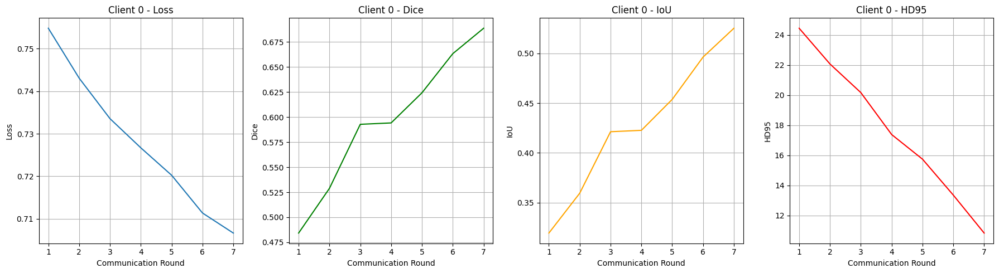

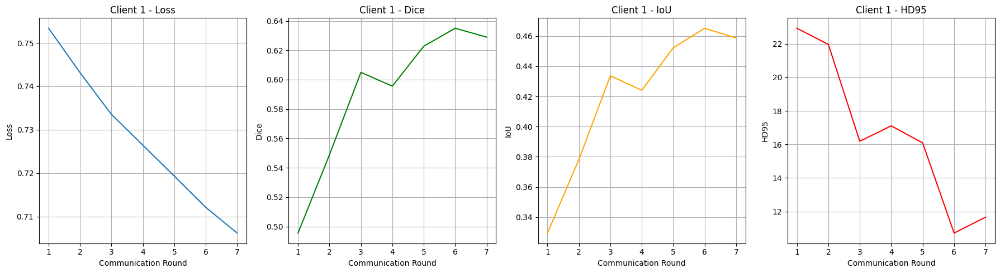

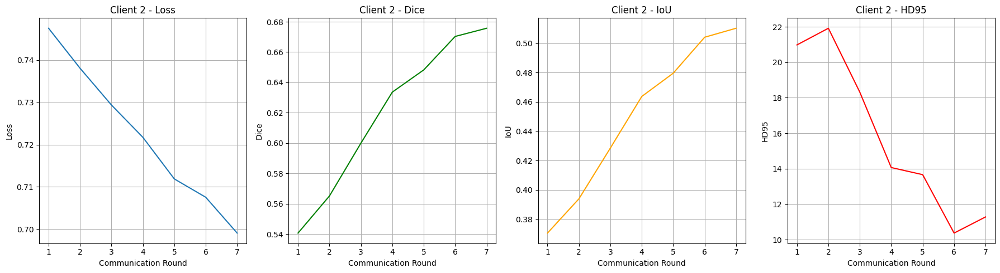

In [18]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

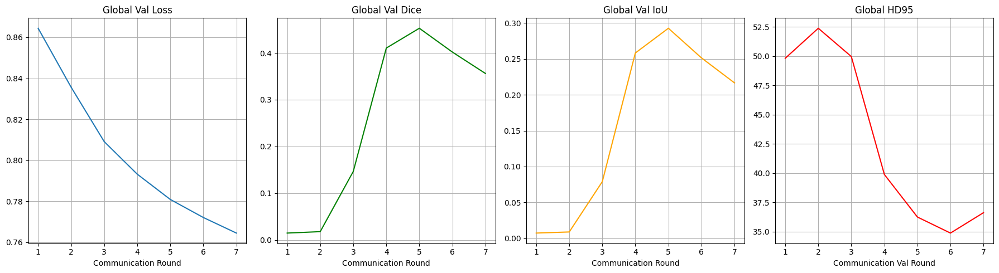

In [19]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [20]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_10760\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
SwinUNETR(
  (swinViT): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 24, kernel_size=(2, 2, 2), stride=(2, 2, 2))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers1): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0-1): 2 x SwinTransformerBlock(
            (norm1): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=24, out_features=72, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=24, out_features=24, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (mlp): MLPBlock(
              (linear1): Linear(in_features=24, out_features=96, bias=True)
              (linear2): Li

Testing:  54%|█████▍    | 27/50 [00:04<00:03,  6.48it/s, Dice=0.4017, IoU=0.2513, HD95=33.7295]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s, Dice=0.4851, IoU=0.3202, HD95=31.4209]


Test Set Metrics:
Dice: 0.4851
IoU: 0.3202
HD95: 31.4209


**Visualize**

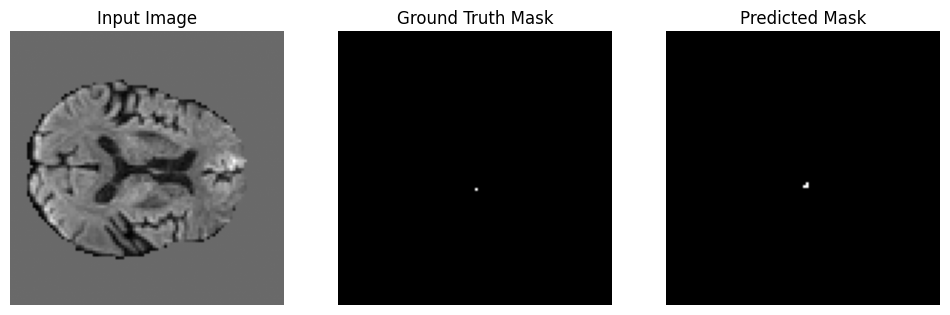

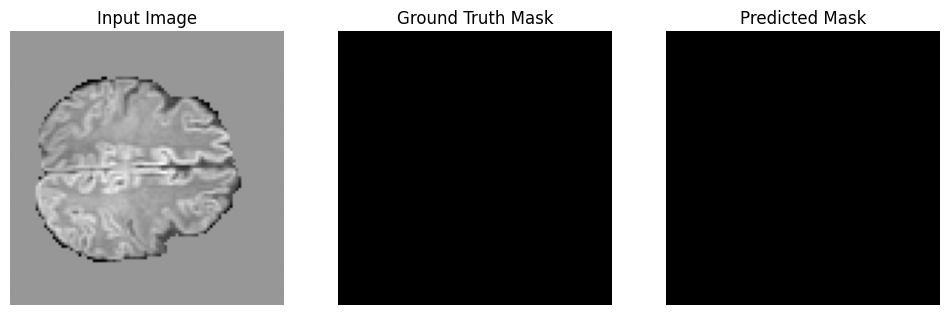

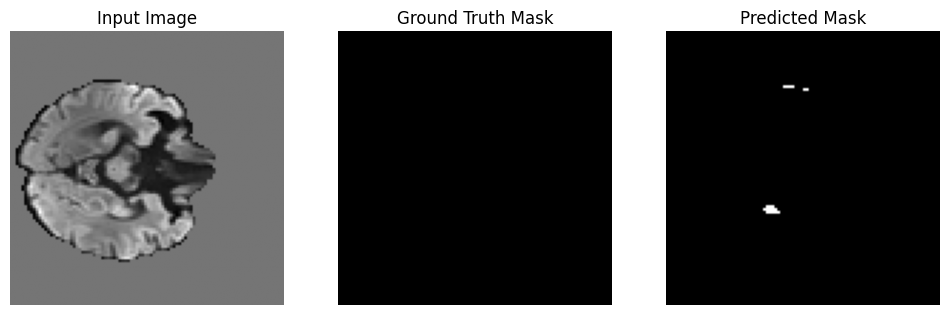

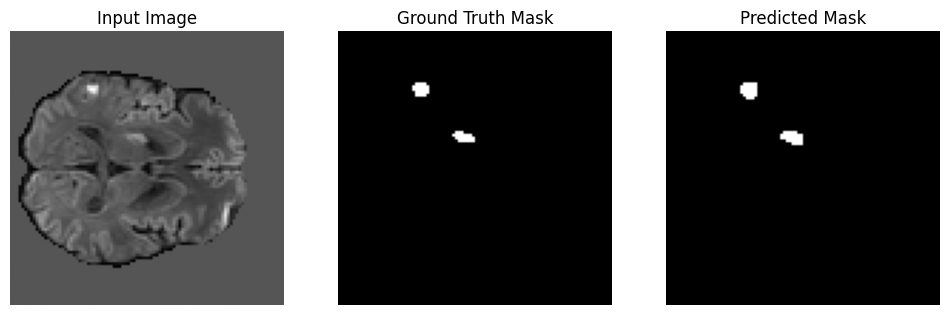

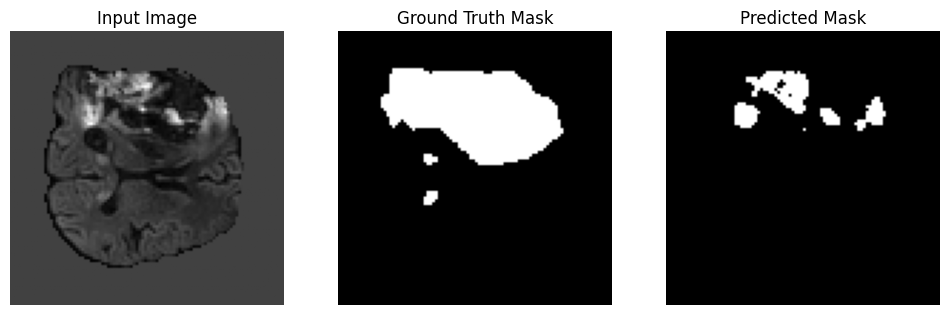

...

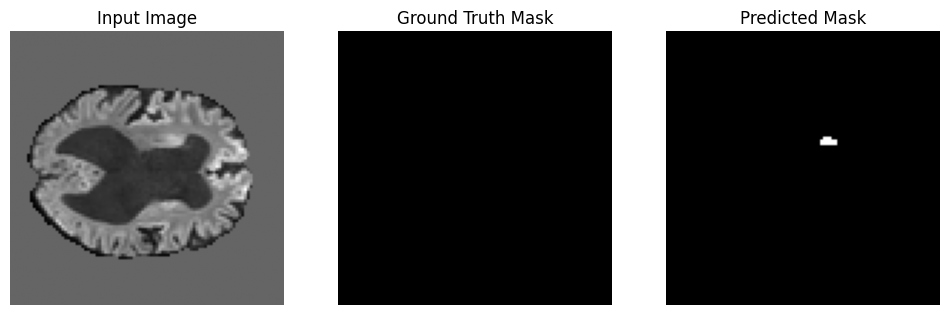

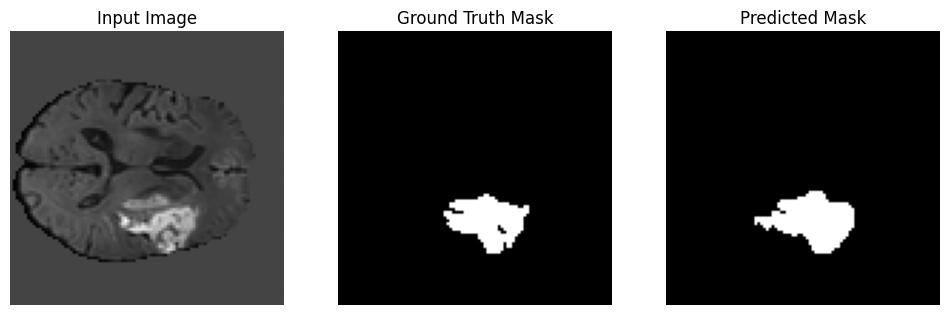

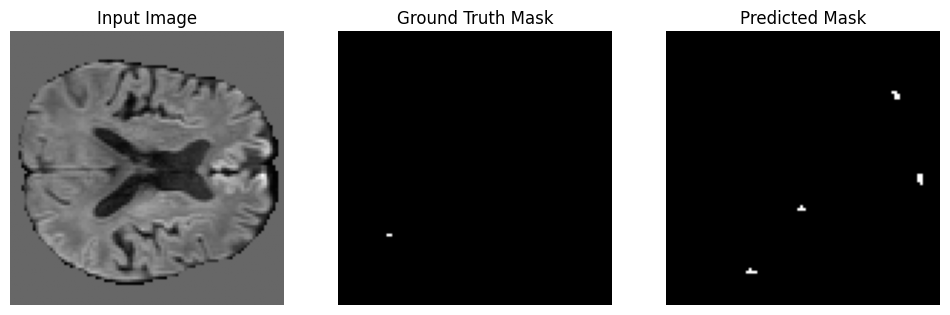

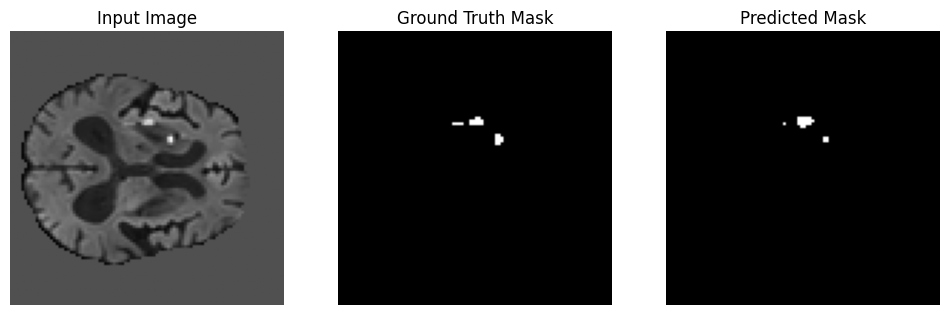

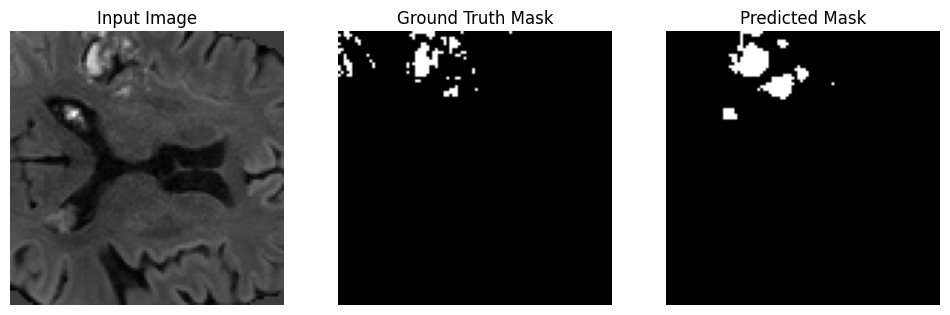

In [21]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()